# Multimodal Modeling Explorations

In [1]:
import csv, os, sys, re, string, json, glob, shutil, random, datetime, math

import cv2
import pandas as pd
import numpy as np

from IPython.display import HTML as html_print
from IPython.display import Markdown
from IPython.display import clear_output

# from IPython.display import Image
from PIL import Image, ImageDraw, ImageFont
from ipywidgets import Video

import torch
from transformers import AutoTokenizer
import nltk
from nltk.tokenize import word_tokenize, sent_tokenize

import warnings
warnings.filterwarnings('ignore')

import seaborn as sns
sns.set()
from matplotlib import pyplot as plt
import matplotlib.patches as patches
%pylab inline

# for auto-reloading external modules
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
sys.path.insert(0, "../all_visualizations")
sys.path.insert(0, "../data_processing")

from visualization_utils import *
from sequencing_utils import show_one_sampled_data as show_one_sampled_data_wikihow
from sequencing_data_processors import WikiHowGeneralProcessor

## Declare Multimodal Modelings

In [3]:
from lavis.models import model_zoo
from lavis.models import load_model_and_preprocess

print(model_zoo)

ModuleNotFoundError: No module named 'lavis'

## Various Datasets

Below let us try some of our datasets in hand for the multimodal tools.

### WikiHow Datasets

In [4]:
# version text is the string in between "wikihow" and "train/test/dev.json"
# E.g., "wikihow-acl22_human_multiref_multimodal-test.json"'s version text is:
# "acl22_human_multiref_multimodal"
version_text_to_use = "acl22_human_multiref_multimodal"

data_root_dir = "/local1/telinwu/research/resources/wikihow/"

wikihow_processor = WikiHowGeneralProcessor(
    data_dir=data_root_dir,
    version_text=version_text_to_use,
    paired_with_image=True,
    images_dir=data_root_dir,
    min_story_length=5,
    max_story_length=5,
    save_missing_images_info=False,
)

# data_wikihow_train = wikihow_processor.get_train_examples()
data_wikihow_train = []

# data_wikihow_dev = wikihow_processor.get_dev_examples()
data_wikihow_dev = []

data_wikihow_test = wikihow_processor.get_test_examples()

data_wikihow = data_wikihow_train + data_wikihow_dev + data_wikihow_test
print("Total Valid Data Sequences: {}".format(len(data_wikihow)))

Using /local1/telinwu/research/resources/wikihow/wikihow-acl22_human_multiref_multimodal-test.json


100%|█████████████████████████████████████████████████████████████████████████████| 301/301 [00:00<00:00, 21345.60it/s]

[WARNING] Number of missing images in test: 0
There are 301 valid story sequences in /local1/telinwu/research/resources/wikihow/wikihow-acl22_human_multiref_multimodal-test.json
Total Valid Data Sequences: 301


Data Index: 89
GT Order References: [[1, 2, 3, 4, 5]]
Article URL: https://www.wikihow.com/Cut-a-Persimmon


[0, 1, 2, 3, 4]

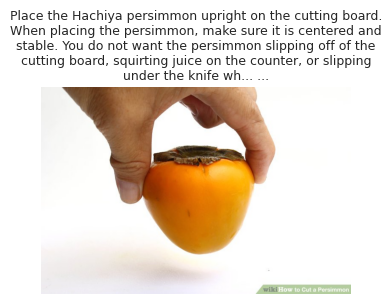

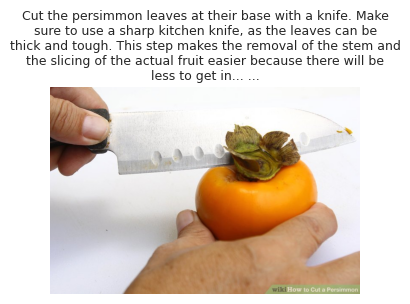

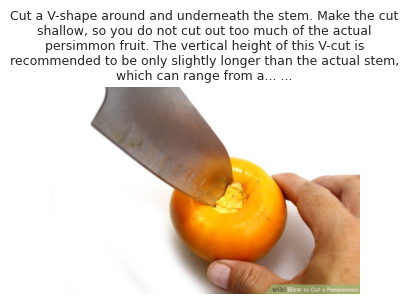

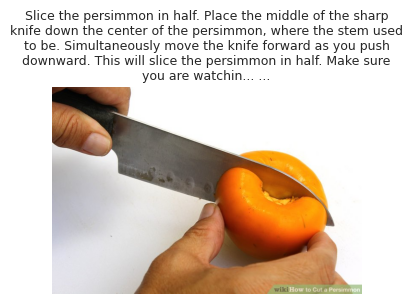

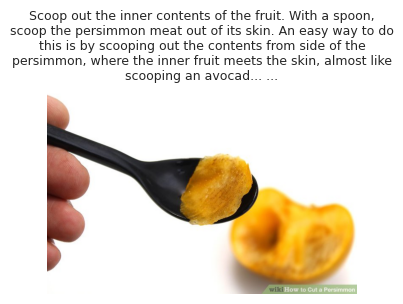

In [5]:
# Randomly select a data point.
rand_idx = np.random.randint(len(data_wikihow))

print("Data Index: {}".format(rand_idx))
print("GT Order References: {}".format(data_wikihow[rand_idx].multiref_gt))

show_one_sampled_data_wikihow(
    data_wikihow[rand_idx], 
    scrambled=False,
    title_max_len=250,
    show_url=True,
    img_size=4,
    font_size=9,
    # unimodal="text",
)

In [6]:
# print("-"*50)
for step_idx in range(len(data_wikihow[rand_idx].text_seq)):
    # print("Step: {}".format(step_idx+1))
    # print(data_wikihow[rand_idx].text_seq[step_idx])
    # print(data_wikihow[rand_idx].img_path_seq[step_idx])
    # print("-"*50)
    pass

In [7]:
# CPU device for the try-outs.
device = torch.device("cpu")

sampled_img_path = np.random.choice(data_wikihow[rand_idx].img_path_seq)
sampled_img = Image.open(sampled_img_path).convert("RGB").resize((256, 256), Image.Resampling.LANCZOS)
display(sampled_img)

AttributeError: type object 'Image' has no attribute 'open'

In [8]:
model, vis_processors, _ = load_model_and_preprocess(
    name="blip_caption",
    model_type="base_coco",
    is_eval=True,
    device=device
)

NameError: name 'load_model_and_preprocess' is not defined

In [9]:
image = vis_processors["eval"](sampled_img).unsqueeze(0).to(device)
lavis_caption = model.generate({"image": image})
print(lavis_caption)

NameError: name 'vis_processors' is not defined

## Instructables.com Datasets

In [10]:
# ...

## Save scod UIDs for download

In [33]:
val_uids = set([video['video_uid'] for video in scod_val_data['clips']])
print(len(val_uids))

f = open("/home/bryanzhou008/project_jarvis/bryan_copied/scod_val_uids.txt", "a")
for uid in val_uids:
    f.write(uid)
    f.write("\n")
f.close()

346


In [34]:
train_uids = set([video['video_uid'] for video in scod_train_data['clips']])
print(len(train_uids))
train_uids = [i for i in train_uids if i not in val_uids]
print(len(train_uids))

f = open("/home/bryanzhou008/project_jarvis/bryan_copied/scod_train_uids.txt", "a")
for uid in train_uids:
    f.write(uid)
    f.write("\n")
f.close()

457
370


## Ego4D Datasets

In [3]:
# Use annotations to filter out the videos list we want.
annots_root = "/local1/hu528/ego4d_data/v1/annotations/"
curr_videos_root = "/local1/jrbronkar/ego4d_videos/v1/full_scale"

all_narrations_file = os.path.join(annots_root, "narration.json")
all_narrations = json.load(open(all_narrations_file))

In [4]:
scod_train_file = "fho_scod_train.json"
scod_train_file = os.path.join(annots_root, scod_train_file)

scod_val_file = "fho_scod_val.json"
scod_val_file = os.path.join(annots_root, scod_val_file)

scod_train_data = json.load(open(scod_train_file))
scod_val_data = json.load(open(scod_val_file))

scod_clips = scod_train_data["clips"] + scod_val_data["clips"]

downloaded_video_id_and_paths = {
    x.split(".mp4")[0]: os.path.join(curr_videos_root, x)
    for x in os.listdir(curr_videos_root) if ".mp4" in x
}
print("Currently we downloaded {} ego4d videos.".format(len(downloaded_video_id_and_paths)))

downloaded_scod_clips = []

for scod_clip in scod_clips:
    video_uid = scod_clip["video_uid"]
    if video_uid in downloaded_video_id_and_paths:
        downloaded_scod_clips.append(scod_clip)

print("And there are {} clips available for scod.".format(len(downloaded_scod_clips)))

Currently we downloaded 779 ego4d videos.
And there are 2114 clips available for scod.


In [5]:
def get_ego4d_scod_clips_and_frames(
    sampled_scod_clip,
    curr_videos_root,
):
    video_uid = sampled_scod_clip["video_uid"]
    ego4d_video_path = os.path.join(
        curr_videos_root,
        "{}.mp4".format(video_uid),
    )
    print("Mother video: {}".format(ego4d_video_path))

    cap = cv2.VideoCapture(ego4d_video_path)
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    frame_cnt = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    duration = float(frame_cnt) / float(fps)
    cap.release()

    print("The fps of video `{}` is: {} of frame counts: {} and duration: {} sec.".format(ego4d_video_path, fps, frame_cnt, duration))

    pre_frame = sampled_scod_clip["pre_frame"]["frame_number"]
    pnr_frame = sampled_scod_clip["pnr_frame"]["frame_number"]
    pos_frame = sampled_scod_clip["post_frame"]["frame_number"]

    pre_secs = pre_frame / fps
    pnr_secs = pnr_frame / fps
    pos_secs = pos_frame / fps

    pre_timestamp = str(datetime.timedelta(seconds=pre_secs))
    pnr_timestamp = str(datetime.timedelta(seconds=pnr_secs))
    pos_timestamp = str(datetime.timedelta(seconds=pos_secs))

    print(pre_frame, pnr_frame, pos_frame)
    print(pre_timestamp, pnr_timestamp, pos_timestamp)

    pre_timestamp_secs = math.floor(float(pre_timestamp.split(":")[-1]))
    pos_timestamp_secs = math.ceil(float(pos_timestamp.split(":")[-1]))

    pre_timestamp = ":".join(pre_timestamp.split(":")[:-1]) + ":" + str(pre_timestamp_secs)
    pos_timestamp = ":".join(pos_timestamp.split(":")[:-1]) + ":" + str(pos_timestamp_secs)

    show_name = "show"
    if os.path.exists("./media/{}.mp4".format(show_name)):
        os.remove("./media/{}.mp4".format(show_name))

    ffmpeg_video_cmd = (
        "/home/telinwu/ffmpeg-git-20220910-amd64-static/ffmpeg -ss {} -to {} "
        "-i {} -c copy -loglevel panic ./media/{}.mp4".format(
            pre_timestamp,
            pos_timestamp,
            ego4d_video_path,
            show_name,
        )
    )
    os.system(ffmpeg_video_cmd)
    print("Executed command: {}".format(ffmpeg_video_cmd))

    for frame_name in ["pre_frame", "pnr_frame", "post_frame"]:
        if os.path.exists("./media/{}.png".format(frame_name)):
            os.remove("./media/{}.png".format(frame_name))
        frame_cnt = sampled_scod_clip[frame_name]["frame_number"]
        ffmpeg_frame_cmd = (
            "/home/telinwu/ffmpeg-git-20220910-amd64-static/ffmpeg "
            "-i {} "
            "-vf select='between(n\,{}\,{})' -vsync 0 "
            "-loglevel panic ./media/{}.png".format(
                ego4d_video_path,
                frame_cnt,
                frame_cnt,
                frame_name,
            )
        )
        os.system(ffmpeg_frame_cmd)
        print("Executed command: {}".format(ffmpeg_frame_cmd))

    # pprint.pprint(sampled_scod_clip)
    return video_uid, {"pre_frame": pre_frame, "pnr_frame": pnr_frame, "post_frame": post_frame}
    
    
def get_scod_clipped_narrations(
    scod_clip,
    curr_videos_root,
    all_narrations,
    narration_pass="narration_pass_1",
):    
    video_uid = scod_clip["video_uid"]
    ego4d_video_path = os.path.join(
        curr_videos_root,
        "{}.mp4".format(video_uid),
    )

    cap = cv2.VideoCapture(ego4d_video_path)
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    frame_cnt = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    duration = float(frame_cnt) / float(fps)
    cap.release()
    
    clip_uid = scod_clip["clip_uid"]
    pre_frame = scod_clip["pre_frame"]
    pnr_frame = scod_clip["pnr_frame"]
    pos_frame = scod_clip["post_frame"]
    curr_narrations = all_narrations[video_uid][narration_pass]["narrations"]
    
    obj_of_change = pnr_frame["bbox"][1]["structured_noun"]
    
    pre_frame_num = pre_frame["frame_number"]
    pnr_frame_num = pnr_frame["frame_number"]
    pos_frame_num = pos_frame["frame_number"]
    
    pre_frame_sec = round(pre_frame_num/fps, 2)
    pnr_frame_sec = round(pnr_frame_num/fps, 2)
    pos_frame_sec = round(pos_frame_num/fps, 2)
    
    clip_narrations = []
    closest_narrations = []
    for i in range(len(curr_narrations)):
        timestamp_sec = curr_narrations[i]["timestamp_sec"]
        timestamp_frame = curr_narrations[i]["timestamp_frame"]
        narration_text = curr_narrations[i]["narration_text"]
        if (
            timestamp_frame >= pre_frame_num
            and timestamp_frame <= pos_frame_sec
        ):
            clip_narrations.append((
                timestamp_sec, timestamp_frame, narration_text
            ))
        
        closest_narrations.append((
            abs(timestamp_frame-pre_frame_num),
            timestamp_sec, timestamp_frame, narration_text,
        ))
        
    closest_narrations = sorted(closest_narrations)[:5]
    closest_narrations = [(a, b, c) for _, a, b, c in closest_narrations]
    
    print("Object of change: {}".format(obj_of_change))
    print("FPS: {}".format(fps))
    print("Pre/PNR/Post frame = {} / {} / {}".format(pre_frame_num, pnr_frame_num, pos_frame_num))
    print("Pre/PNR/Post sec   = {} / {} / {}".format(
        str(datetime.timedelta(seconds=pre_frame_sec))[:10],
        str(datetime.timedelta(seconds=pnr_frame_sec))[:10],
        str(datetime.timedelta(seconds=pos_frame_sec))[:10])
    )
    
    for a, b, c in closest_narrations:
        print("[{}]({}) {}".format(str(datetime.timedelta(seconds=a))[:10], b, c))
    
    return clip_narrations, closest_narrations

def draw_bbox_on_image(image, bbox_list, object_name=None, bbox_width=2, label_font_size=12):
    # Read images and draw rectangles.
    if type(image) is str:  # An image path.
        im = Image.open(image)
    else:
        im = image
    draw = ImageDraw.Draw(im)
    # Get a font.
    font = ImageFont.truetype("../all_visualizations/arial.ttf", size=label_font_size)
    offset = 2
    
    verts = bbox_list
    draw.rectangle(
        [(verts[0], verts[1]), (verts[0] + verts[2], verts[1] + verts[3])],
        width=bbox_width,
    )
    # Draw text with black background.
    text = object_name
    if text is None:
        text = "NULL"
    text_width, text_height = font.getsize(text)
    draw.rectangle(
        (
            verts[0] + offset,
            verts[1] + offset,
            verts[0] + 2 * offset + text_width,
            verts[1] + 2 * offset + text_height,
        ),
        fill="black",
    )
    draw.text(
        (verts[0] + offset, verts[1] + offset),
        text,
        fill=(255, 255, 255),
        font=font,
    )
    
    return im

In [7]:
annots_root = "/local1/hu528/ego4d_data/v1/annotations/"
curr_videos_root = "/local1/jrbronkar/ego4d_videos/v1/full_scale"

rand_idx = np.random.choice(np.arange(len(downloaded_scod_clips)))
# rand_idx = 985
# rand_idx = 626
rand_idx = 1703

print("Data Index: {}".format(rand_idx))
sampled_scod_clip = downloaded_scod_clips[rand_idx]

clip_narrations, closest_narrations = get_scod_clipped_narrations(
    sampled_scod_clip,
    curr_videos_root,
    all_narrations,
    narration_pass="narration_pass_1",
)

video_uid, frames_dict = get_ego4d_scod_clips_and_frames(
    sampled_scod_clip,
    curr_videos_root,
)

Data Index: 1703
Object of change: pan_(frypan,_pan,_saucepan)
FPS: 30
Pre/PNR/Post frame = 87849 / 87870 / 87960
Pre/PNR/Post sec   = 0:48:48.30 / 0:48:49 / 0:48:52
[0:48:49.45](87883) #C C picks up another frying pan from the box 
[0:48:51.30](87938) #C C puts the frying pans together 
[0:48:41.29](87638) #C C picks up the frying pans from the floor 
[0:48:57.34](88120) #C C picks up the shopping bag from the floor 
[0:48:59.47](88184) #C C walks around the house 
Mother video: /local1/jrbronkar/ego4d_videos/v1/full_scale/5fa671a8-c6c9-40bc-9d3d-f97d94133965.mp4
The fps of video `/local1/jrbronkar/ego4d_videos/v1/full_scale/5fa671a8-c6c9-40bc-9d3d-f97d94133965.mp4` is: 30 of frame counts: 108476 and duration: 3615.866666666667 sec.
87849 87870 87960
0:48:48.300000 0:48:49 0:48:52
Executed command: /home/telinwu/ffmpeg-git-20220910-amd64-static/ffmpeg -ss 0:48:48 -to 0:48:52 -i /local1/jrbronkar/ego4d_videos/v1/full_scale/5fa671a8-c6c9-40bc-9d3d-f97d94133965.mp4 -c copy -loglevel pani

NameError: name 'post_frame' is not defined

#### Show Video and Meta

In [6]:
curr_videos_root = "."
video_uid = "show"

ego4d_video_path = os.path.join(
    curr_videos_root,
    "./media/{}.mp4".format(video_uid),
)
print(ego4d_video_path)

Video.from_file(
    ego4d_video_path
)

././media/show.mp4


FileNotFoundError: [Errno 2] No such file or directory: '././media/show.mp4'

In [8]:
video_read_in = cv2.VideoCapture(ego4d_video_path)
success, video_image = video_read_in.read()
video_frames = []

while success:
    video_frames.append(video_image)
    success, video_image = video_read_in.read()

print(len(video_frames))

0


In [10]:
# API ref: https://github.com/salesforce/LAVIS/blob/480a9f382f0f4426fbb767b1803be924453fad0d/lavis/models/blip_models/blip_caption.py

ego4d_img = Image.fromarray(video_frames[0][:, :, ::-1], "RGB")
display(ego4d_img)

image = vis_processors["eval"](ego4d_img).unsqueeze(0).to(device)
lavis_caption = model.generate(
    {"image": image},
    num_beams=4,
    repetition_penalty=0.9,
    num_captions=5,
    use_nucleus_sampling=True,
)

pprint.pprint(lavis_caption)

AttributeError: type object 'Image' has no attribute 'fromarray'

In [11]:
frame_images = {
    "pre_frame":  "./media/pre_frame.png",
    "pnr_frame":  "./media/pnr_frame.png",
    "post_frame": "./media/post_frame.png",
}
list_of_active_objects = []

for frame in ["pre_frame", "pnr_frame", "post_frame"]:
    print("Frame: {}".format(frame))
    frame_image = frame_images[frame]
    for bbox_info in sampled_scod_clip[frame]["bbox"]:
        bbox = bbox_info["bbox"]
        if bbox_info["object_type"] == "object_of_change":
            list_of_active_objects.append(bbox_info["structured_noun"])
            bboxed_frame_image = draw_bbox_on_image(
                frame_image,
                [bbox["x"], bbox["y"], bbox["width"], bbox["height"]],
                bbox_info["structured_noun"],
                bbox_width=4,
                label_font_size=30,
            )
            # bboxed_frame_image = bboxed_frame_image.resize((512, 512), Image.Resampling.LANCZOS)
            display(bboxed_frame_image)

print("Active objects:")
pprint.pprint(list_of_active_objects)
# pprint.pprint(sampled_scod_clip)

Frame: pre_frame


AttributeError: type object 'Image' has no attribute 'open'

In [41]:
# Indices: 
# ...

### For GLIP 

In [288]:
def create_glip_config_file(
    narration,
    video_uid,
    frames_dict,
    glip_images_folder="../../GLIP/DATASET/ego4d/frames/test",
    glip_config_file_template="../../GLIP/configs/ego4d/ego4d_template.yaml",
    glip_config_file_output="../../GLIP/configs/ego4d/ego4d_test.yaml",
):
    narration_tokens = word_tokenize(narration)
    is_noun = lambda pos: pos[:2] == 'NN'
    narration_nouns = sorted(list(set([word for (word, pos) in nltk.pos_tag(narration_tokens) if is_noun(pos)])))
    if "C " in narration:
        narration_nouns.pop(narration_nouns.index("C"))

    print(narration)
    print(narration_nouns)

    override_category = []
    override_category_mapping = {}
    caption_prompt = []
    override_category_id = 1
    for noun in narration_nouns:
        override_category.append({
            "id": override_category_id,
            "name": noun,
            "supercategory": "objects",
        })
        override_category_mapping[override_category_id] = noun
        override_category_id += 1

        prefix = []
        name = []
        suffix = []
        now_suffix = False
        for token in narration_tokens:
            if token == noun:
                name.append(noun)
                now_suffix = True
            elif now_suffix:
                suffix.append(token)
            else:
                prefix.append(token)
        prefix = " ".join(prefix)
        name = " ".join(name)
        suffix = " ".join(suffix)
        caption_prompt.append({
            "prefix": prefix,
            "name": name,
            "suffix": suffix,
        })

    num_classes = len(narration_nouns)

    to_revise = {
        "CAPTION_PROMPT": str(caption_prompt),
        "OVERRIDE_CATEGORY": str(override_category),
        "NUM_CLASSES": str(num_classes+1)
    }

    pprint.pprint(to_revise)
    print(video_uid, pre_frame, pnr_frame, post_frame)

    # Copy frames to GLIP folder
    for frame in ["pre_frame", "pnr_frame", "post_frame"]:
        src_img = "./media/{}.png".format(frame)
        dst_img = os.path.join(
            glip_images_folder,
            "{}_{}.png".format(video_uid, frames_dict[frame])
        )
        print("Moving image from {} to {}".format(src_img, dst_img))
        shutil.copy(src_img, dst_img)

    glip_config_file_output = open(glip_config_file_output, "w")

    for line in open(glip_config_file_template):
        line = line.rstrip()
        for key in to_revise:
            if key in line and key != "NUM_CLASSES":
                line = line.replace("TODO", to_revise[key].replace("\'", "\""))
            elif key in line:
                line = "    NUM_CLASSES: {}".format(to_revise[key])
        glip_config_file_output.write(line+"\n")
    glip_config_file_output.close()
    
    return override_category, override_category_mapping, caption_prompt, narration_tokens

In [289]:
def create_glip_dataset_file(
    override_category,
    video_uid,
    frames_dict,
    coco_annots_test_json="../../GLIP/DATASET/ego4d/annotations/image_info_test-dev2017.json",
    output_dataset_file="../../GLIP/DATASET/ego4d/annotations/ego4d_test.json",
):
    coco_annots_test = json.load(open(coco_annots_test_json))
    print(coco_annots_test.keys())
    pprint.pprint(coco_annots_test["images"][0])

    new_d = {
        "info": coco_annots_test["info"],
        "images": [],
        "licenses": coco_annots_test["licenses"],
        "categories": override_category,
    }

    for frame in ["pre_frame", "pnr_frame", "post_frame"]:
        img = Image.open("./media/{}.png".format(frame))
        width = img.width
        height = img.height
        image_d = {
            "coco_url": "",
            "date_captured": "",
            "file_name": "{}_{}.png".format(video_uid, frames_dict[frame]),
            "height": height,
            "width": width,
            "license": 6,
            "id": "{}_{}".format(video_uid, frames_dict[frame]),
        }
        new_d["images"].append(image_d)

    json.dump(
        new_d,
        open(output_dataset_file, "w"),
        indent=4,
    )

In [331]:
def plot_glip_bboxes(
    video_uid,
    frames_dict,
    narration_tokens,
    override_category_mapping,
    top_k_bboxes=3,
    pred_bboxes_file ="../../GLIP/test_ego4d_eval_outputs/eval/glip_tiny_model_o365_goldg_cc_sbu/inference/test/bbox.json",
    glip_images_folder="../../GLIP/DATASET/ego4d/frames/test",
    resize_image_width=None,
):
    pred_bboxes = json.load(open(pred_bboxes_file))
    pred_bboxes_on_images = {}
    for bbox in pred_bboxes:
        image_id = bbox["image_id"]
        img_path = os.path.join(
            glip_images_folder,
            "{}.png".format(image_id)
        )
        assert os.path.exists(img_path)
        if image_id not in pred_bboxes_on_images:
            pred_bboxes_on_images[image_id] = {
                "img_path": img_path,
                "bboxes": []
            }
        pred_bboxes_on_images[image_id]["bboxes"].append({
            "score": bbox["score"],
            "bbox": bbox["bbox"],
            "label": override_category_mapping[bbox["category_id"]]
        })

    for image_id in pred_bboxes_on_images:
        pred_bboxes_on_images[image_id]["bboxes"] = sorted(
            pred_bboxes_on_images[image_id]["bboxes"],
            key=lambda x: x["score"],
            reverse=True
        )

    # pprint.pprint(pred_bboxes_on_images)

    for frame in ["pre_frame", "pnr_frame", "post_frame"]:
        _img = os.path.join(
            glip_images_folder,
            "{}_{}.png".format(video_uid, frames_dict[frame])
        )
        frame_images[frame] = _img

    for frame in ["pre_frame", "pnr_frame", "post_frame"]:
        print("Frame: {}".format(frame))
        print("Narrations: {}".format(narration_tokens))
        frame_image = Image.open(frame_images[frame])
        frame_image_id = "{}_{}".format(video_uid, frames_dict[frame])
        bboxes = pred_bboxes_on_images[frame_image_id]["bboxes"]
        bboxed_frame_image = frame_image
        for bbox_info in bboxes[:top_k_bboxes]:
            bbox = bbox_info["bbox"]
            bboxed_frame_image = draw_bbox_on_image(
                bboxed_frame_image,
                [bbox[0], bbox[1], bbox[2], bbox[3]],
                bbox_info["label"]+": {:.4f}".format(bbox_info["score"]),
                bbox_width=4,
                label_font_size=30,
            )
        if (
            resize_image_width is not None
            and (type(resize_image_width) is int or
                 type(resize_image_width) is float)
        ):
            wpercent = (resize_image_width / float(bboxed_frame_image.size[0]))
            hsize = int((float(bboxed_frame_image.size[1]) * float(wpercent)))
            bboxed_frame_image = bboxed_frame_image.resize((resize_image_width, hsize), Image.Resampling.LANCZOS)
        display(bboxed_frame_image)

In [332]:
def glip_inference_for_bboxes(
    narration,
    video_uid,
    frames_dict,
    glip_images_folder="../../GLIP/DATASET/ego4d/frames/test",
    glip_config_file_template="../../GLIP/configs/ego4d/ego4d_template.yaml",
    glip_config_file_output="../../GLIP/configs/ego4d/ego4d_test.yaml",
    coco_annots_test_json="../../GLIP/DATASET/ego4d/annotations/image_info_test-dev2017.json",
    output_dataset_file="../../GLIP/DATASET/ego4d/annotations/ego4d_test.json",
    run_glip_commands=[
        "sh run_glip.sh",
    ],
    pred_bboxes_file="../../GLIP/test_ego4d_eval_outputs/eval/glip_tiny_model_o365_goldg_cc_sbu/inference/test/bbox.json",
    top_k_bboxes=3,
    resize_image_width=None,
):
    (override_category,
     override_category_mapping,
     caption_prompt,
     narration_tokens) = create_glip_config_file(
        narration,
        video_uid,
        frames_dict,
        glip_images_folder=glip_images_folder,
        glip_config_file_template=glip_config_file_template,
        glip_config_file_output=glip_config_file_output,
    )

    create_glip_dataset_file(
        override_category,
        video_uid,
        frames_dict,
        coco_annots_test_json=coco_annots_test_json,
        output_dataset_file=output_dataset_file,
    )

    for cmd in run_glip_commands:
        os.system(cmd)
    clear_output()

    plot_glip_bboxes(
        video_uid,
        frames_dict,
        narration_tokens,
        override_category_mapping,
        top_k_bboxes=top_k_bboxes,
        pred_bboxes_file=pred_bboxes_file,
        glip_images_folder=glip_images_folder,
        resize_image_width=resize_image_width,
    )

In [268]:
glip_images_folder = "../../GLIP/DATASET/ego4d/frames/test"
glip_config_file_template = "../../GLIP/configs/ego4d/ego4d_template.yaml"
glip_config_file_output = "../../GLIP/configs/ego4d/ego4d_test.yaml"
# Write some narrations.
narration = closest_narrations[0][-1].split("#C ")[-1].strip()
narration = "The carabiner is now in the possession of the person who removed it from the hook."

(override_category,
 override_category_mapping,
 caption_prompt) = create_glip_config_file(
    narration,
    video_uid,
    frames_dict,
    glip_images_folder=glip_images_folder,
    glip_config_file_template=glip_config_file_template,
    glip_config_file_output=glip_config_file_output,
)

The carabiner is now in the possession of the person who removed it from the hook.
['carabiner', 'hook', 'person', 'possession']
{'CAPTION_PROMPT': "[{'prefix': 'The', 'name': 'carabiner', 'suffix': 'is now "
                   'in the possession of the person who removed it from the '
                   "hook .'}, {'prefix': 'The carabiner is now in the "
                   "possession of the person who removed it from the', 'name': "
                   "'hook', 'suffix': '.'}, {'prefix': 'The carabiner is now "
                   "in the possession of the', 'name': 'person', 'suffix': "
                   "'who removed it from the hook .'}, {'prefix': 'The "
                   "carabiner is now in the', 'name': 'possession', 'suffix': "
                   "'of the person who removed it from the hook .'}]",
 'NUM_CLASSES': '5',
 'OVERRIDE_CATEGORY': "[{'id': 1, 'name': 'carabiner', 'supercategory': "
                      "'objects'}, {'id': 2, 'name': 'hook', 'supercategory': "
     

In [269]:
coco_annots_test_json = "../../GLIP/DATASET/ego4d/annotations/image_info_test-dev2017.json"
output_dataset_file = "../../GLIP/DATASET/ego4d/annotations/ego4d_test.json"
run_glip_commands=[
    "sh run_glip.sh",
]

create_glip_dataset_file(
    override_category,
    video_uid,
    frames_dict,
    coco_annots_test_json=coco_annots_test_json,
    output_dataset_file=output_dataset_file,
)

for cmd in run_glip_commands:
    os.system(cmd)
clear_output()

In [ ]:
pred_bboxes_file = "../../GLIP/test_ego4d_eval_outputs/eval/glip_tiny_model_o365_goldg_cc_sbu/inference/test/bbox.json"
top_k_bboxes = 3

plot_glip_bboxes(
    video_uid,
    frames_dict,
    top_k_bboxes=top_k_bboxes,
    pred_bboxes_file=pred_bboxes_file,
    glip_images_folder=glip_images_folder,
    resize_image_width=800,
)

Frame: pre_frame
Narrations: ['C', 'removes', 'carabiner', 'from', 'the', 'hook']


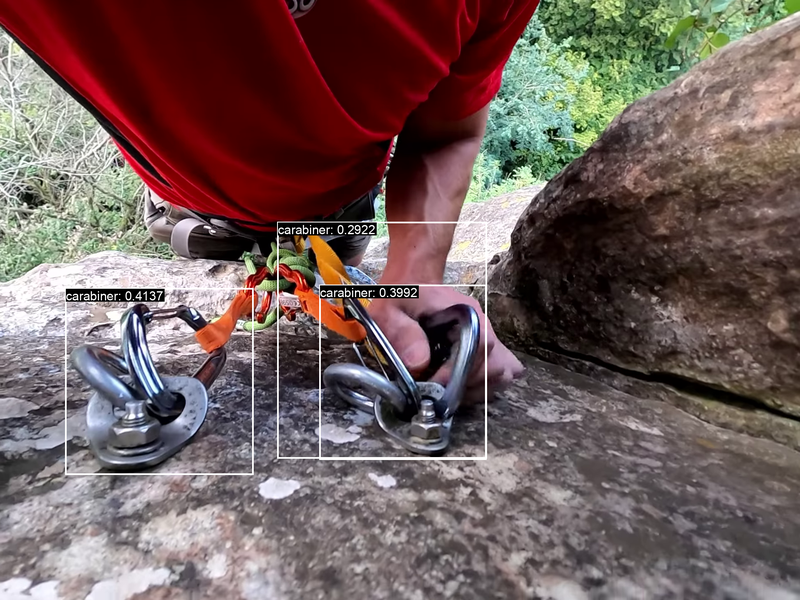

Frame: pnr_frame
Narrations: ['C', 'removes', 'carabiner', 'from', 'the', 'hook']


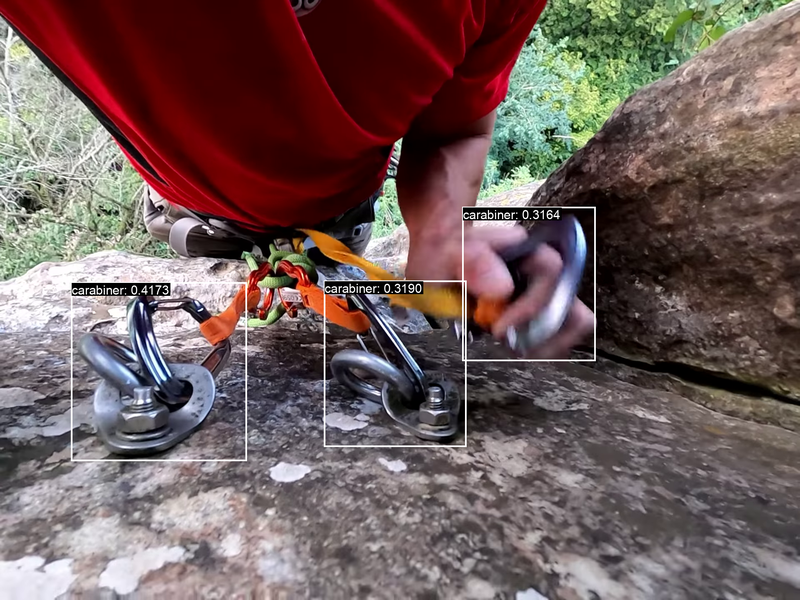

Frame: post_frame
Narrations: ['C', 'removes', 'carabiner', 'from', 'the', 'hook']


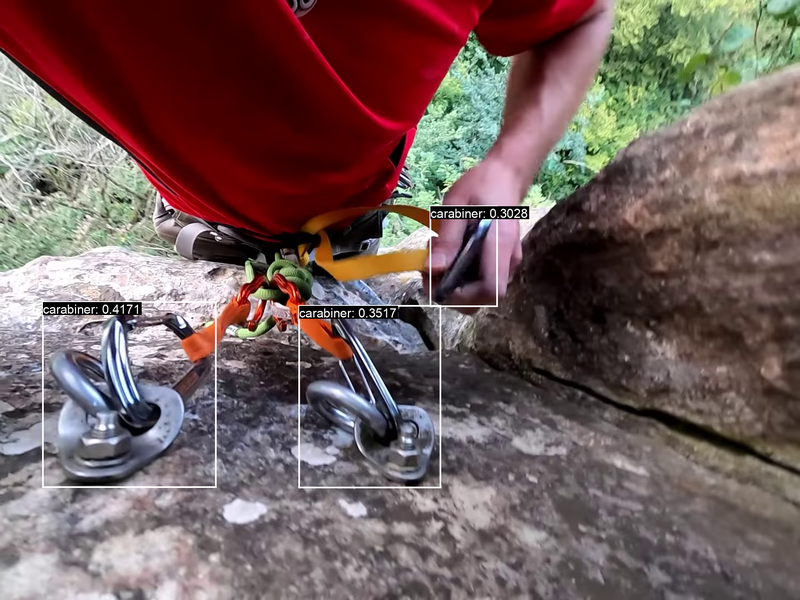

In [294]:
glip_images_folder = "../../GLIP/DATASET/ego4d/frames/test"
glip_config_file_template = "../../GLIP/configs/ego4d/ego4d_template.yaml"
glip_config_file_output = "../../GLIP/configs/ego4d/ego4d_test.yaml"
coco_annots_test_json = "../../GLIP/DATASET/ego4d/annotations/image_info_test-dev2017.json"
output_dataset_file = "../../GLIP/DATASET/ego4d/annotations/ego4d_test.json"
run_glip_commands=[
    "sh run_glip.sh",
]
pred_bboxes_file = "../../GLIP/test_ego4d_eval_outputs/eval/glip_tiny_model_o365_goldg_cc_sbu/inference/test/bbox.json"
top_k_bboxes = 3
# Write some narrations.
narration = closest_narrations[0][-1].split("#C ")[-1].strip()

glip_inference_for_bboxes(
    narration,
    video_uid,
    frames_dict,
    glip_images_folder=glip_images_folder,
    glip_config_file_template=glip_config_file_template,
    glip_config_file_output=glip_config_file_output,
    coco_annots_test_json=coco_annots_test_json,
    output_dataset_file=output_dataset_file,
    run_glip_commands=run_glip_commands,
    pred_bboxes_file=pred_bboxes_file,
    top_k_bboxes=top_k_bboxes,
    resize_image_width=800,
)

Frame: pre_frame
Narrations: ['The', 'carabiner', 'is', 'now', 'in', 'the', 'possession', 'of', 'the', 'person', 'who', 'removed', 'it', 'from', 'the', 'hook', '.']


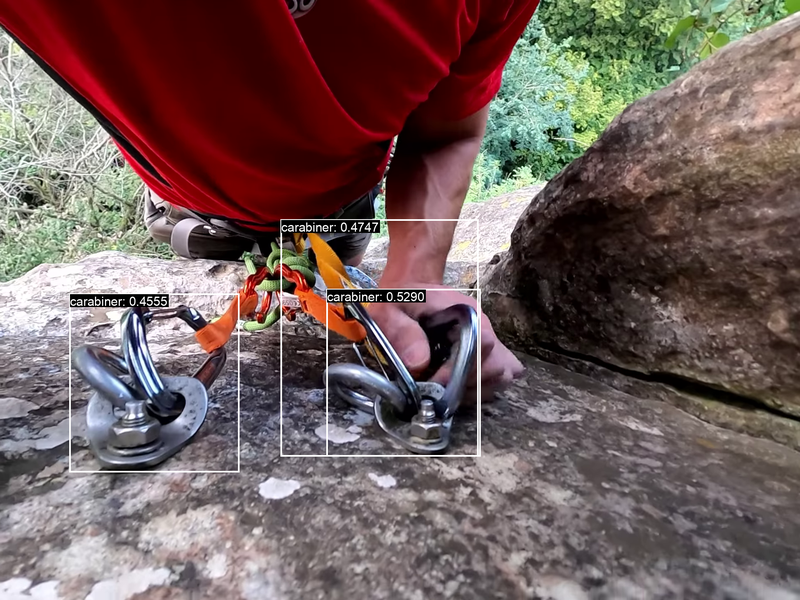

Frame: pnr_frame
Narrations: ['The', 'carabiner', 'is', 'now', 'in', 'the', 'possession', 'of', 'the', 'person', 'who', 'removed', 'it', 'from', 'the', 'hook', '.']


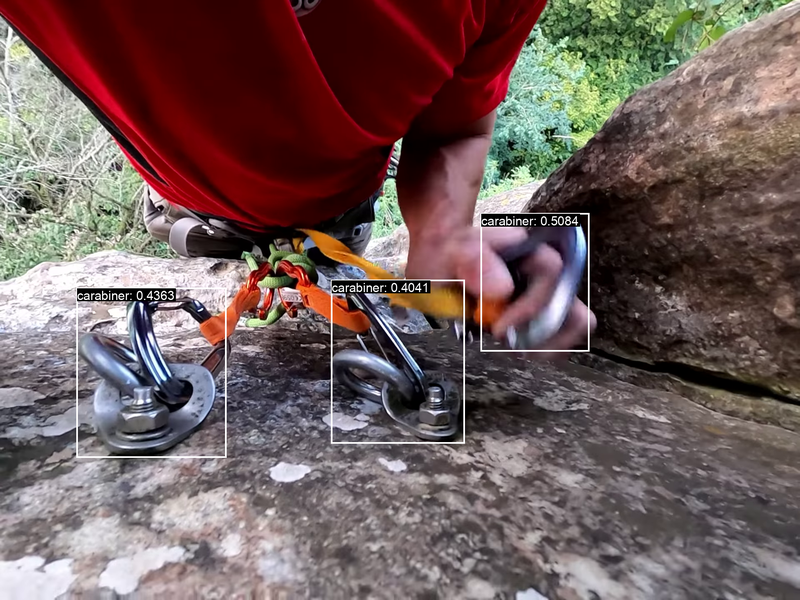

Frame: post_frame
Narrations: ['The', 'carabiner', 'is', 'now', 'in', 'the', 'possession', 'of', 'the', 'person', 'who', 'removed', 'it', 'from', 'the', 'hook', '.']


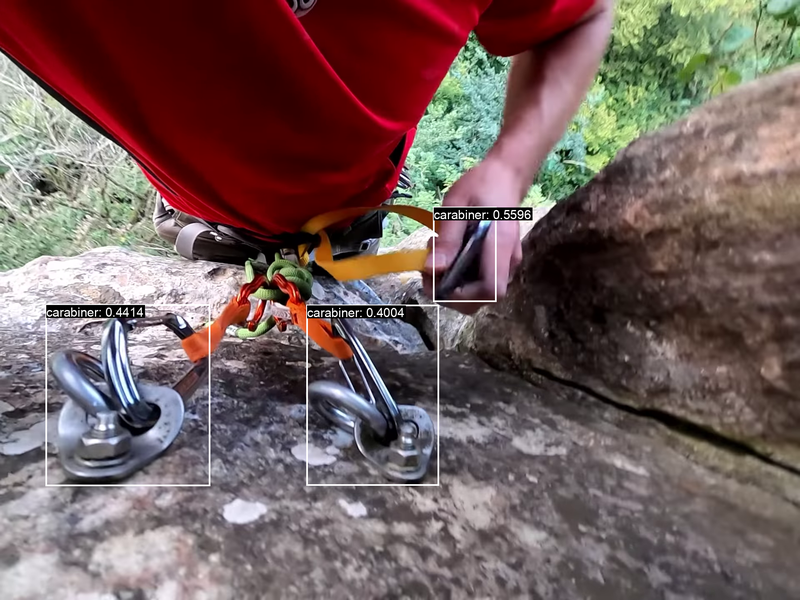

In [293]:
narration = "The carabiner is now in the possession of the person who removed it from the hook."


glip_inference_for_bboxes(
    narration,
    video_uid,
    frames_dict,
    glip_images_folder=glip_images_folder,
    glip_config_file_template=glip_config_file_template,
    glip_config_file_output=glip_config_file_output,
    coco_annots_test_json=coco_annots_test_json,
    output_dataset_file=output_dataset_file,
    run_glip_commands=run_glip_commands,
    pred_bboxes_file=pred_bboxes_file,
    top_k_bboxes=top_k_bboxes,
    resize_image_width=800,
)

Frame: pre_frame
Narrations: ['C', 'picks', 'up', 'another', 'frying', 'pan', 'from', 'the', 'box']


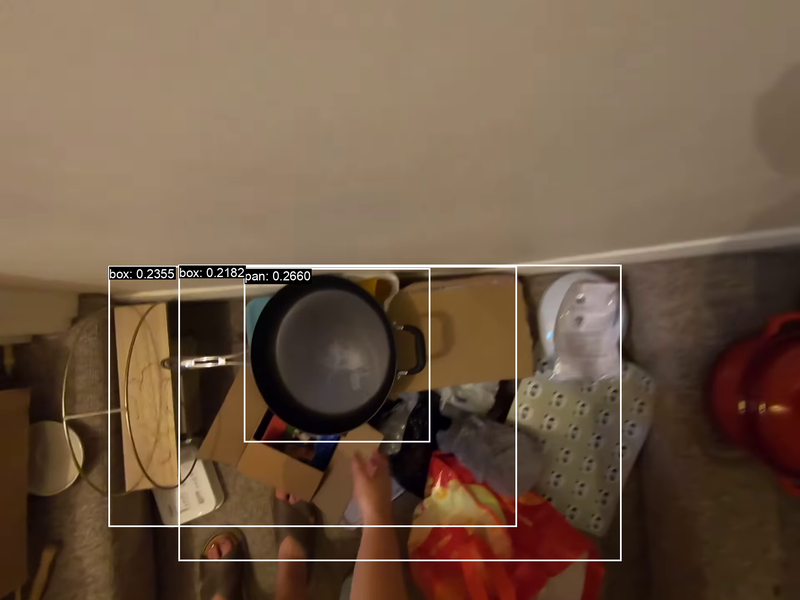

Frame: pnr_frame
Narrations: ['C', 'picks', 'up', 'another', 'frying', 'pan', 'from', 'the', 'box']


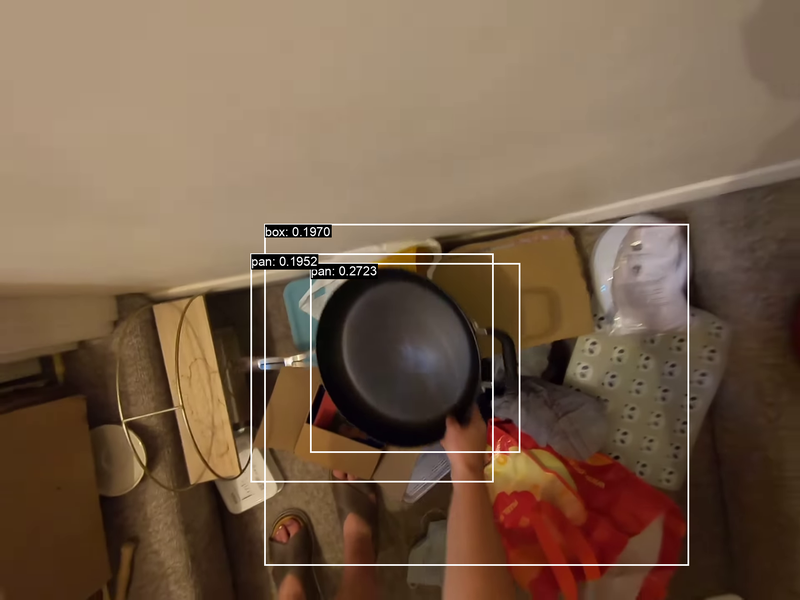

Frame: post_frame
Narrations: ['C', 'picks', 'up', 'another', 'frying', 'pan', 'from', 'the', 'box']


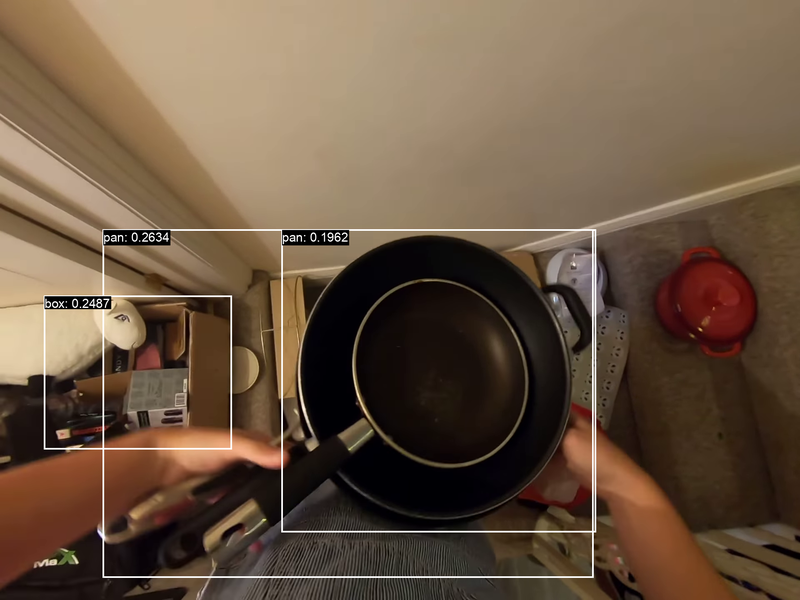

In [333]:
glip_images_folder = "../../GLIP/DATASET/ego4d/frames/test"
glip_config_file_template = "../../GLIP/configs/ego4d/ego4d_template.yaml"
glip_config_file_output = "../../GLIP/configs/ego4d/ego4d_test.yaml"
coco_annots_test_json = "../../GLIP/DATASET/ego4d/annotations/image_info_test-dev2017.json"
output_dataset_file = "../../GLIP/DATASET/ego4d/annotations/ego4d_test.json"
run_glip_commands=[
    "sh run_glip.sh",
]
pred_bboxes_file = "../../GLIP/test_ego4d_eval_outputs/eval/glip_tiny_model_o365_goldg_cc_sbu/inference/test/bbox.json"
top_k_bboxes = 3
# Write some narrations.
narration = closest_narrations[0][-1].split("#C ")[-1].strip()


glip_inference_for_bboxes(
    narration,
    video_uid,
    frames_dict,
    glip_images_folder=glip_images_folder,
    glip_config_file_template=glip_config_file_template,
    glip_config_file_output=glip_config_file_output,
    coco_annots_test_json=coco_annots_test_json,
    output_dataset_file=output_dataset_file,
    run_glip_commands=run_glip_commands,
    pred_bboxes_file=pred_bboxes_file,
    top_k_bboxes=top_k_bboxes,
    resize_image_width=800,
)

Frame: pre_frame
Narrations: ['The', 'frying', 'pan', 'is', 'now', 'in', 'the', 'possession', 'of', 'the', 'person', 'who', 'performed', 'the', 'action', '.']


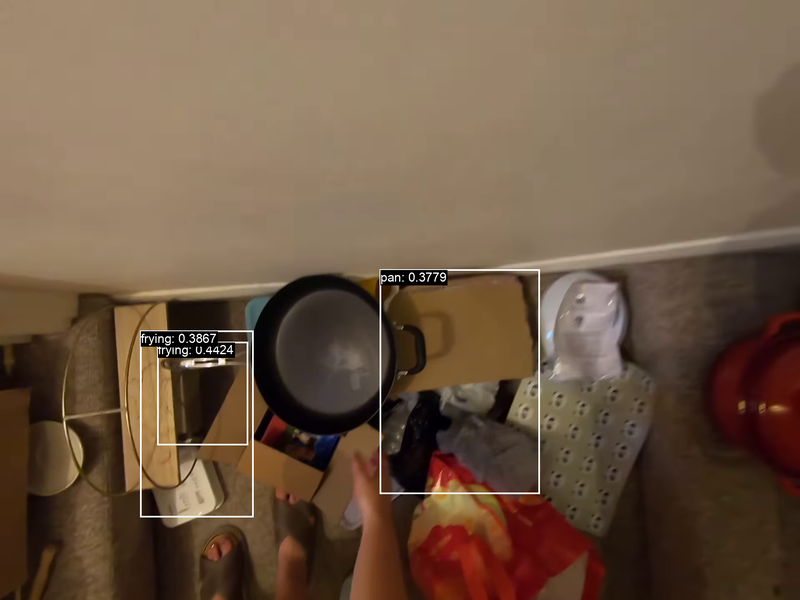

Frame: pnr_frame
Narrations: ['The', 'frying', 'pan', 'is', 'now', 'in', 'the', 'possession', 'of', 'the', 'person', 'who', 'performed', 'the', 'action', '.']


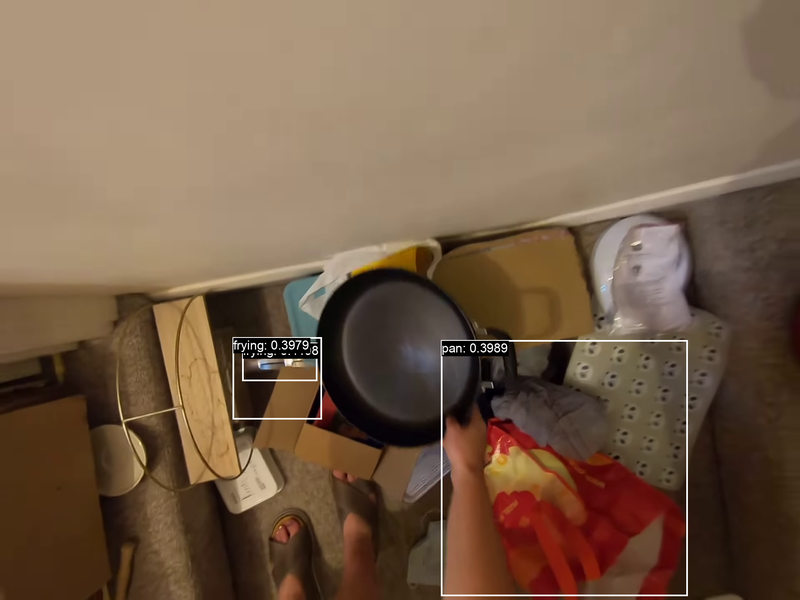

Frame: post_frame
Narrations: ['The', 'frying', 'pan', 'is', 'now', 'in', 'the', 'possession', 'of', 'the', 'person', 'who', 'performed', 'the', 'action', '.']


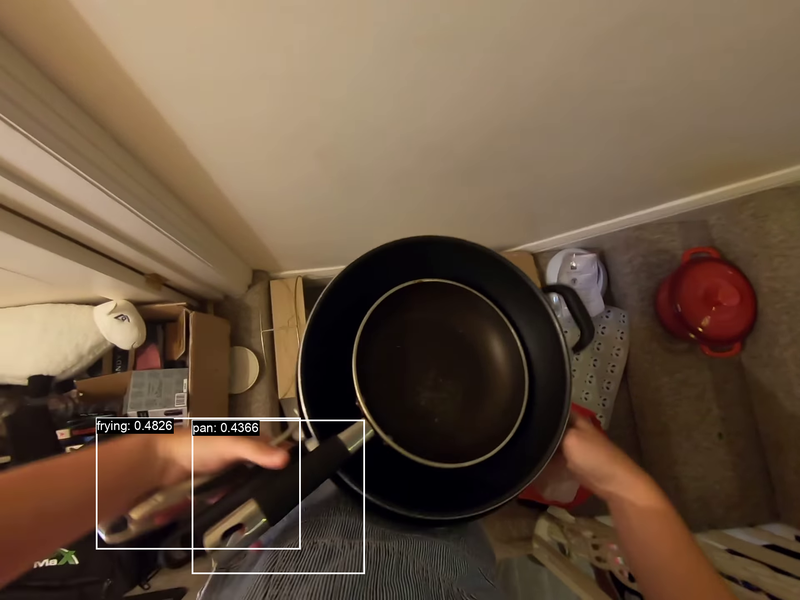

In [334]:
narration = "The frying pan is now in the possession of the person who performed the action."


glip_inference_for_bboxes(
    narration,
    video_uid,
    frames_dict,
    glip_images_folder=glip_images_folder,
    glip_config_file_template=glip_config_file_template,
    glip_config_file_output=glip_config_file_output,
    coco_annots_test_json=coco_annots_test_json,
    output_dataset_file=output_dataset_file,
    run_glip_commands=run_glip_commands,
    pred_bboxes_file=pred_bboxes_file,
    top_k_bboxes=top_k_bboxes,
    resize_image_width=800,
)

## STA

In [354]:
sta_annots_test = "fho_sta_val.json"
sta_annots_test = os.path.join(annots_root, sta_annots_test)
sta_annots = json.load(open(sta_annots_test))

print(len(sta_annots["annotations"]))

17217


In [368]:
print(sta_annots.keys())

annot_idx = np.random.choice(len(sta_annots["annotations"]))
pprint.pprint(sta_annots["info"].keys())
noun_cats = {}
verb_cats = {}
for cat in sta_annots["noun_categories"]:
    noun_cats[cat["id"]] = cat["name"]
for cat in sta_annots["verb_categories"]:
    verb_cats[cat["id"]] = cat["name"]
pprint.pprint(sta_annots["info"]["video_metadata"][sta_annots["annotations"][annot_idx]["video_id"]])
for bbox_idx in range(len(sta_annots["annotations"][annot_idx]["objects"])):
    sta_annots["annotations"][annot_idx]["objects"][bbox_idx]["verb"] = \
        verb_cats[sta_annots["annotations"][annot_idx]["objects"][bbox_idx]["verb_category_id"]]
    sta_annots["annotations"][annot_idx]["objects"][bbox_idx]["noun"] = \
        noun_cats[sta_annots["annotations"][annot_idx]["objects"][bbox_idx]["noun_category_id"]]
pprint.pprint(sta_annots["annotations"][annot_idx])
sta_frame_number = sta_annots["annotations"][annot_idx]["frame"]
video_uid = sta_annots["annotations"][annot_idx]["video_id"]
print(video_uid, sta_frame_number)

dict_keys(['info', 'annotations', 'noun_categories', 'verb_categories'])
dict_keys(['description', 'version', 'split', 'include_annotations', 'video_metadata', 'year', 'date_created'])
{'fps': 30.0, 'frame_height': 1440, 'frame_width': 1920}
{'clip_frame': 320,
 'clip_id': 469,
 'clip_uid': '15929976-8630-46c5-ae6b-84a4dacd2634',
 'frame': 320,
 'objects': [{'box': [650.94, 155.4, 795.98, 435.11],
              'noun': 'screw_(bolt,_nail,_screw)',
              'noun_category_id': 63,
              'time_to_contact': 1.6333333333333333,
              'verb': 'move_(transfer,_pass,_exchange)',
              'verb_category_id': 33}],
 'uid': '3558a7e6-5c41-4035-b6cd-954311d2862c_0000320',
 'video_id': '3558a7e6-5c41-4035-b6cd-954311d2862c'}
3558a7e6-5c41-4035-b6cd-954311d2862c 320


In [375]:
downloaded_video_id_and_paths = {
    x.split(".mp4")[0]: os.path.join(curr_videos_root, x)
    for x in os.listdir(curr_videos_root) if ".mp4" in x
}
print("Currently we downloaded {} ego4d videos.".format(len(downloaded_video_id_and_paths)))

downloaded_sta_annots = []
for idx in range(len(sta_annots["annotations"])):
    video_uid = sta_annots["annotations"][idx]["video_id"]
    if video_uid in downloaded_video_id_and_paths:
        downloaded_sta_annots.append(sta_annots["annotations"][idx])
print(len(downloaded_sta_annots))

Currently we downloaded 779 ego4d videos.
1009


In [385]:
sta_rand_idx = np.random.choice(len(downloaded_sta_annots))
print(sta_rand_idx)

curr_downloaded_sta_annots = downloaded_sta_annots[sta_rand_idx]
video_uid = curr_downloaded_sta_annots["video_id"]
sta_frame_number = curr_downloaded_sta_annots["frame"]

curr_videos_root = "/local1/jrbronkar/ego4d_videos/v1/full_scale"
ego4d_video_path = os.path.join(
    curr_videos_root,
    "{}.mp4".format(video_uid),
)
print("Mother video: {}".format(ego4d_video_path))
assert os.path.exists(ego4d_video_path)
frame_name = "sta_demo"

ffmpeg_frame_cmd = (
    "/home/telinwu/ffmpeg-git-20220910-amd64-static/ffmpeg "
    "-i {} "
    "-vf select='between(n\,{}\,{})' -vsync 0 "
    "-loglevel panic ./media/{}.png".format(
        ego4d_video_path,
        sta_frame_number,
        sta_frame_number,
        frame_name,
    )
)
if os.path.exists("./media/sta_demo.png"):
    os.remove("./media/sta_demo.png")
print("Executed command: {}".format(ffmpeg_frame_cmd))
os.system(ffmpeg_frame_cmd)

874
Mother video: /local1/jrbronkar/ego4d_videos/v1/full_scale/c019e4c6-45f5-4e01-9e4f-6ec4712850ce.mp4
Executed command: /home/telinwu/ffmpeg-git-20220910-amd64-static/ffmpeg -i /local1/jrbronkar/ego4d_videos/v1/full_scale/c019e4c6-45f5-4e01-9e4f-6ec4712850ce.mp4 -vf select='between(n\,3820\,3820)' -vsync 0 -loglevel panic ./media/sta_demo.png


0

{'clip_frame': 3820,
 'clip_id': 2879,
 'clip_uid': '13eaa90a-9292-4eec-8f3a-4b4605a01630',
 'frame': 3820,
 'objects': [{'box': [298.71, 635.4, 868.49, 956.55],
              'noun_category_id': 53,
              'time_to_contact': 0.1,
              'verb_category_id': 8}],
 'uid': 'c019e4c6-45f5-4e01-9e4f-6ec4712850ce_0003820',
 'video_id': 'c019e4c6-45f5-4e01-9e4f-6ec4712850ce'}


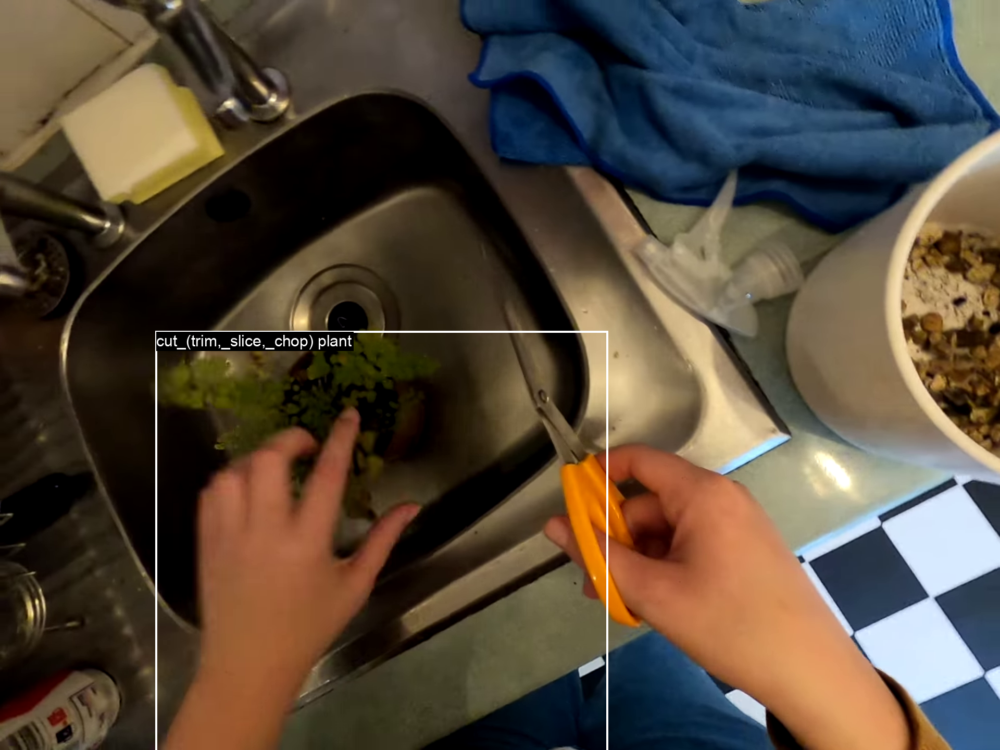

In [388]:
pprint.pprint(curr_downloaded_sta_annots)

bbox = curr_downloaded_sta_annots["objects"][0]["box"]
noun_id = curr_downloaded_sta_annots["objects"][0]["noun_category_id"]
verb_id = curr_downloaded_sta_annots["objects"][0]["verb_category_id"]
noun = noun_cats[noun_id]
verb = verb_cats[verb_id]

bboxed_frame_image = draw_bbox_on_image(
    "./media/sta_demo.png",
    bbox,
    "{} {}".format(verb, noun),
    bbox_width=4,
    label_font_size=30,
)
# bboxed_frame_image = bboxed_frame_image.resize((512, 512), Image.Resampling.LANCZOS)
display(bboxed_frame_image)

# END